In [1]:
!pip install opencv-python

In [186]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [216]:
img = cv2.cvtColor(cv2.imread("/content/img3.jpg"),cv2.COLOR_BGR2RGB)

In [217]:
def gaussian_kernel(sigma: int | float,filter_shape: list | tuple | None):
    m, n = filter_shape
    m_half = m // 2
    n_half = n // 2

    # initializing the filter
    gaussian_filter = np.zeros((m, n), np.float32)

    # generating the filter
    for y in range(-m_half, m_half):
        for x in range(-n_half, n_half):
            normal = 1 / (2.0 * np.pi * sigma**2.0)
            exp_term = np.exp(-(x**2.0 + y**2.0) / (2.0 * sigma**2.0))
            gaussian_filter[y+m_half, x+n_half] = normal * exp_term
    return gaussian_filter / np.sum(gaussian_filter)

In [213]:
def display_image_in_actual_size(image):

    dpi = 80
    im_data = image
    height, width, depth = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

In [218]:
# Apply the Gaussian kernel to the image
kernel_size = 9
sigma = 1.5
kernel = gaussian_kernel(sigma,(kernel_size,kernel_size))
blurred_image = cv2.filter2D(img, -1, kernel)

In [219]:
K = 1.2
kernel2 = gaussian_kernel(K * sigma,(kernel_size,kernel_size))
blurred_image2 = cv2.filter2D(img, -1, kernel2)

In [220]:
DOG = blurred_image - blurred_image2
DOG = cv2.normalize(DOG, None, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
retv, DOG = cv2.threshold(DOG,0.5,1,cv2.THRESH_BINARY)
#retv, DOG = cv2.cvtColor(DOG,cv2.COLOR_BGR2RGBA)

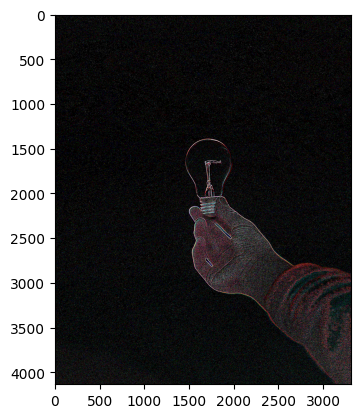

In [221]:
plt.imshow(DOG)
plt.show()

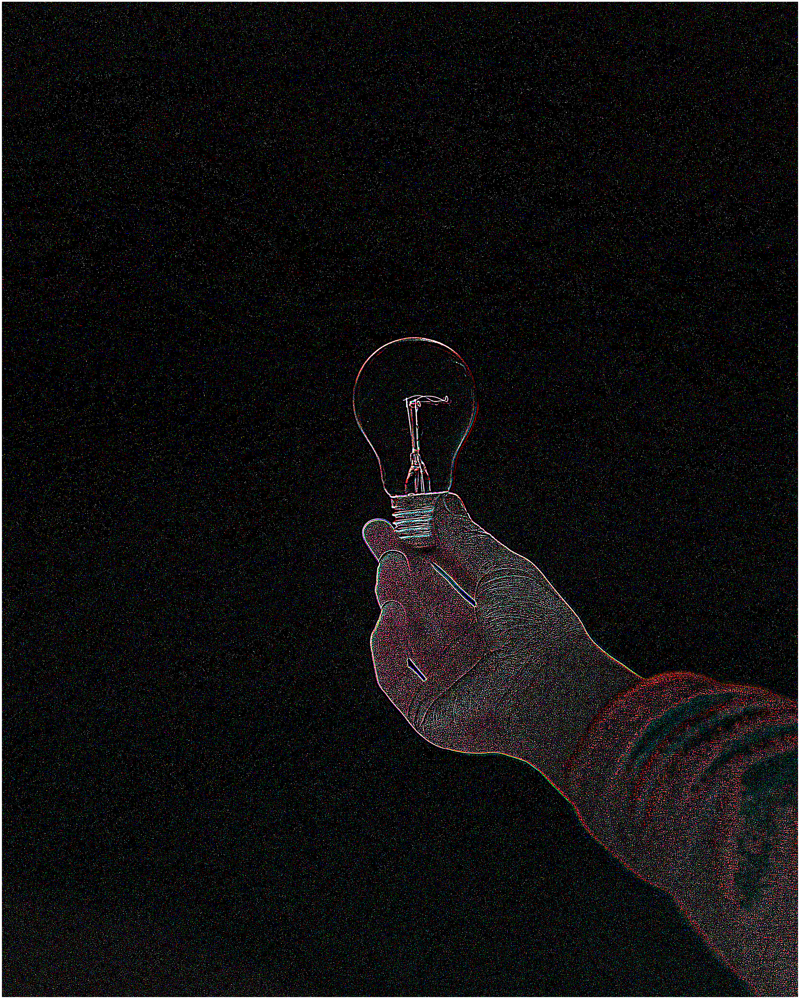

In [222]:
display_image_in_actual_size(DOG)

In [ ]:
cv2_imshow(blurred_image)